<a href="https://colab.research.google.com/github/Kharleel/Kharleel/blob/main/Faster_R_CNN_Detectron2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# blog :
# https://ai.facebook.com/blog/-detectron2-a-pytorch-based-modular-object-detection-library-/
# https://ai.facebook.com/tools/detectron2/

# Detectron2 Beginner's Tutorial : Colab
# https://colab.research.google.com/drive/16jcaJoc6bCFAQ96jDe2HwtXj7BMD_-m5

# Detectron2 Model Zoo and Baselines :
# https://github.com/facebookresearch/detectron2/blob/master/MODEL_ZOO.md

In [ ]:
# Mounting Google Drive
from google.colab import drive
drive.mount("/content/drive")


Mounted at /content/drive


# **Install Detectron2**

In [ ]:
# install dependencies:
!pip install pyyaml==5.1
# workaround: install old version of pytorch since detectron2 hasn't released packages for pytorch 1.9 (issue: https://github.com/facebookresearch/detectron2/issues/3158)
!pip install torch==1.8.0+cu101 torchvision==0.9.0+cu101 -f https://download.pytorch.org/whl/torch_stable.html

# install detectron2 that matches pytorch 1.8
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.8/index.html
# exit(0)  # After installation, you need to "restart runtime" in Colab. This line can also restart runtime


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 274 kB 4.7 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=a0a0104a50a0d0372d3a1ee5453f603b1ba466e7730f818f2f8f0ab8b13bb6fe
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0
    Uninstalling PyYAML-6.0:
      Successfully uninstalled PyYAML-6.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask 2022.2.0 requires pyyaml>=5.3.1, but you have pyyaml 5.1 which is incompatible.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/

In [ ]:
# check pytorch installation:
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
assert torch.__version__.startswith("1.8")   # please manually install torch 1.8 if Colab changes its default version


1.8.0+cu101 True


# **Instance Segmentation**

In [ ]:
"""
You can use this package to convert labelme annotations to COCO format.
https://github.com/fcakyon/labelme2coco
"""
#!pip install labelme2coco
!pip install labelme2coco==0.1.2


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# import package
import labelme2coco

# set directory that contains labelme annotations and image files
labelme_folder_train = "/content/drive/MyDrive/detectron/brain_tumor_segmentation_mri_2d/train/"
labelme_folder_test  = "/content/drive/MyDrive/detectron/brain_tumor_segmentation_mri_2d/test/"
# set path for coco json to be saved
save_json_path_train = "/content/drive/MyDrive/detectron/brain_tumor_segmentation_mri_2d/train/train_coco.json"
save_json_path_test  = "/content/drive/MyDrive/detectron/brain_tumor_segmentation_mri_2d/test/test_coco.json"
# convert labelme annotations to coco
labelme2coco.convert(labelme_folder_train, save_json_path_train)
labelme2coco.convert(labelme_folder_test, save_json_path_test)

print("Done...")


Done...


In [ ]:
# if your dataset is in COCO format, this cell can be replaced by the following three lines:
# from detectron2.data.datasets import register_coco_instances
# register_coco_instances("my_dataset_train", {}, "json_annotation_train.json", "path/to/image/dir")
# register_coco_instances("my_dataset_val", {}, "json_annotation_val.json", "path/to/image/dir")

# Register Custom Detectron2 Data
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/drive/MyDrive/detectron/brain_tumor_segmentation_mri_2d/train/train_coco.json", "/content/drive/MyDrive/detectron/brain_tumor_segmentation_mri_2d/train")
register_coco_instances("my_dataset_test", {},  "/content/drive/MyDrive/detectron/brain_tumor_segmentation_mri_2d/test/test_coco.json", "/content/drive/MyDrive/detectron/brain_tumor_segmentation_mri_2d/test")

print("Done...")


Done...


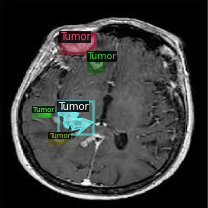

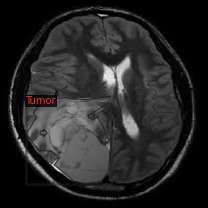

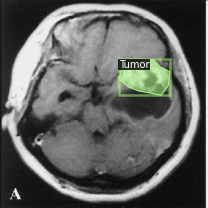

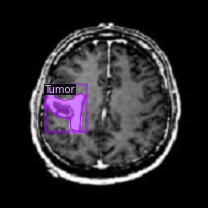

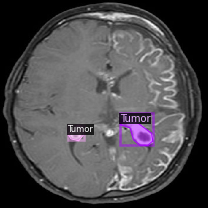

In [ ]:
# visualize training data
from detectron2.data import MetadataCatalog, DatasetCatalog
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

import random
from detectron2.utils.visualizer import Visualizer
import cv2
from google.colab.patches import cv2_imshow
for d in random.sample(dataset_dicts, 5):
    img = cv2.imread(d["file_name"])
    #cv2_imshow(img)
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])
    print("\n")


In [ ]:
# Train the model
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os
from detectron2 import model_zoo

# faster_rcnn
model_link = "COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"

# Detectron2.config package
# https://detectron2.readthedocs.io/modules/config.html

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(model_link))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(model_link)
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 600
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 32
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()



[10/13 01:34:24 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[10/13 01:34:25 d2.engine.train_loop]: Starting training from iteration 0
[10/13 01:34:44 d2.utils.events]:  eta: 0:08:51  iter: 19  total_loss: 1.495  loss_cls: 0.7105  loss_box_reg: 0.6753  loss_rpn_cls: 0.06542  loss_rpn_loc: 0.008085  time: 0.9442  data_time: 0.0146  lr: 8.1588e-06  max_mem: 8744M
[10/13 01:35:04 d2.utils.events]:  eta: 0:08:49  iter: 39  total_loss: 1.569  loss_cls: 0.6521  loss_box_reg: 0.8175  loss_rpn_cls: 0.04315  loss_rpn_loc: 0.007497  time: 0.9633  data_time: 0.0066  lr: 1.6484e-05  max_mem: 8744M
[10/13 01:35:24 d2.utils.events]:  eta: 0:08:54  iter: 59  total_loss: 1.417  loss_cls: 0.5546  loss_box_reg: 0.838  loss_rpn_cls: 0.02739  loss_rpn_loc: 0.005442  time: 0.9837  data_time: 0.0059  lr: 2.4809e-05  max_mem: 8744M
[10/13 01:35:44 d2.utils.events]:  eta: 0:08:38  iter: 79  total_loss: 1.434  loss_cls: 0.5132  loss_box_reg: 0.8678  loss_rpn_cls: 0.02409  loss_rpn_loc: 0.005376  time: 0.9856  data_time: 0.0067  lr: 3.3134e-05  max_mem: 8744M
[10/13 01:3

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output


<IPython.core.display.Javascript object>

In [ ]:
# Test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.engine import DefaultPredictor
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.50
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)


WARNING [10/13 01:46:44 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
[10/13 01:46:44 d2.data.datasets.coco]: Loaded 11 images in COCO format from /content/drive/MyDrive/detectron/brain_tumor_segmentation_mri_2d/test/test_coco.json
[10/13 01:46:44 d2.data.build]: Distribution of instances among all 1 categories:
|  category  | #instances   |
|:----------:|:-------------|
|   Tumor    | 12           |
|            |              |
[10/13 01:46:44 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[10/13 01:46:44 d2.data.common]: Serializing 11 elements to byte tensors and concatenating them all ...
[10/13 01:46:44 d2.data.common]: Serialized dataset takes 0.01 MiB
[10/13 01:46:44 d2.evaluation.evaluator]: Start inference on 11 batches
[10/13 01:46:46 d2.evaluation.evaluator]: In

OrderedDict([('bbox',
              {'AP': 77.66187333019016,
               'AP50': 100.0,
               'AP75': 100.0,
               'APs': nan,
               'APm': nan,
               'APl': 78.21862186218623})])

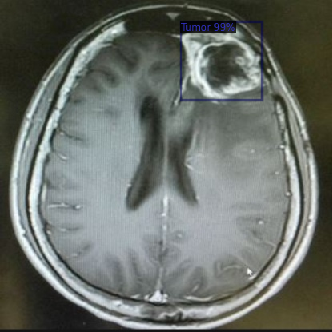

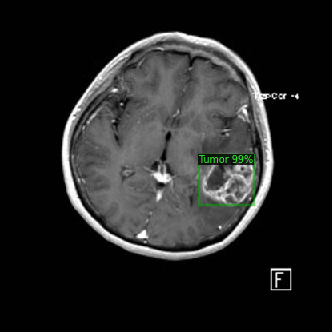

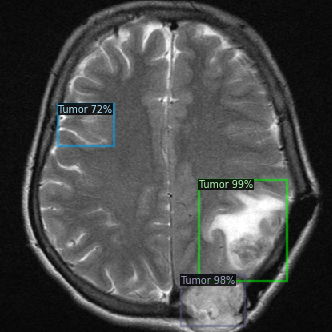

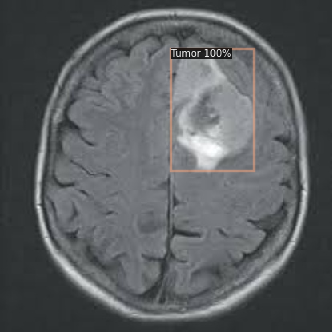

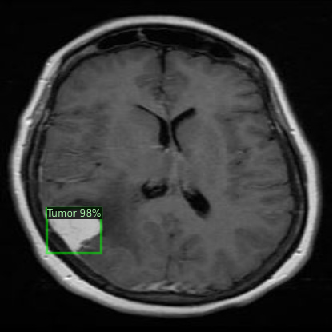

...

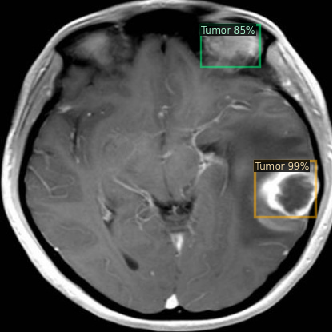

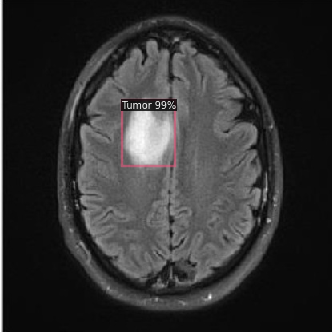

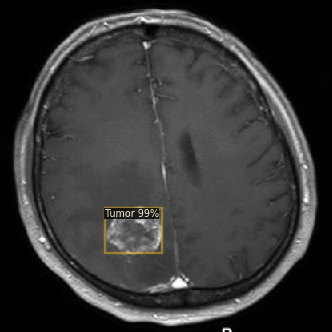

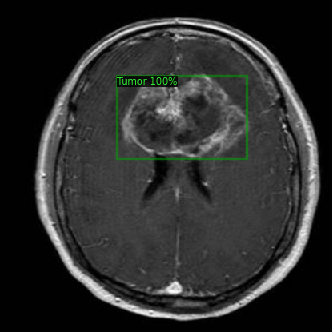

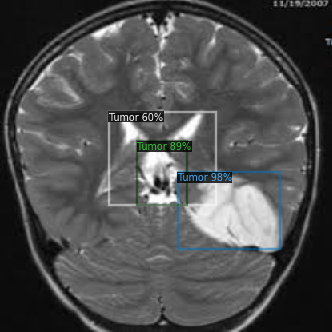

In [ ]:
# Inference & evaluation using the trained model
# cfg already contains everything we've set previously. Now we changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")


from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob("/content/drive/MyDrive/detectron/brain_tumor_segmentation_mri_2d/test/*jpg"):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata,
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])
  print("\n")


In [ ]:
# Save model_final.pth
%cp /content/output/model_final.pth  /content/drive/MyDrive/detectron/brain_tumor_segmentation_mri_2d


# **Using Saved Model**

In [ ]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# Mounting Google Drive
from google.colab import drive
drive.mount("/content/drive")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


Classes : 
 tensor([0], device='cuda:0')
Scores : 
 tensor([0.9909], device='cuda:0')


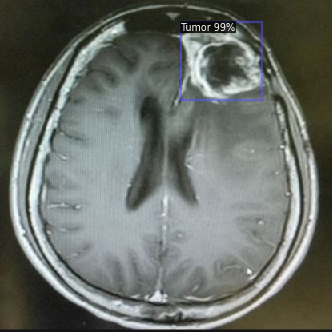



Classes : 
 tensor([0], device='cuda:0')
Scores : 
 tensor([0.9868], device='cuda:0')


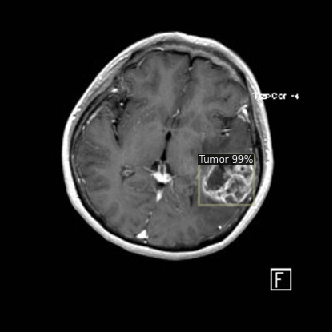



Classes : 
 tensor([0, 0, 0], device='cuda:0')
Scores : 
 tensor([0.9941, 0.9809, 0.7153], device='cuda:0')


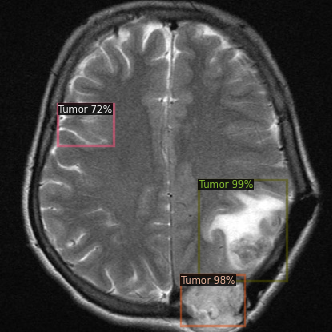



Classes : 
 tensor([0], device='cuda:0')
Scores : 
 tensor([0.9960], device='cuda:0')


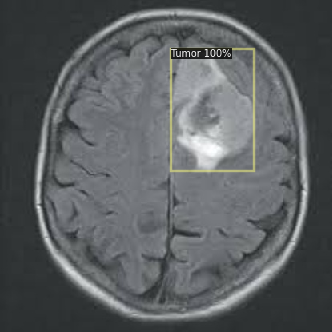



Classes : 
 tensor([0], device='cuda:0')
Scores : 
 tensor([0.9779], device='cuda:0')


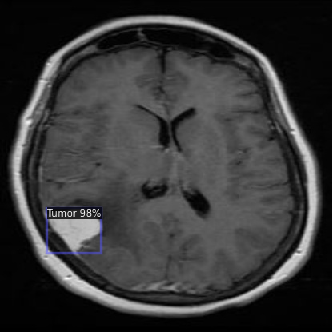



Classes : 
 tensor([0, 0], device='cuda:0')
Scores : 
 tensor([0.9864, 0.5025], device='cuda:0')


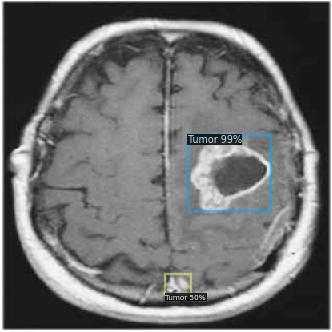



Classes : 
 tensor([0, 0], device='cuda:0')
Scores : 
 tensor([0.9890, 0.8476], device='cuda:0')


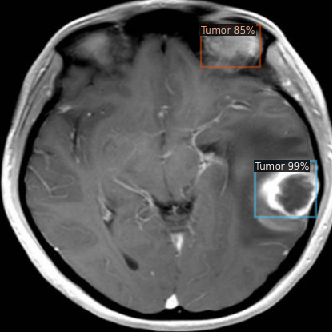



Classes : 
 tensor([0], device='cuda:0')
Scores : 
 tensor([0.9862], device='cuda:0')


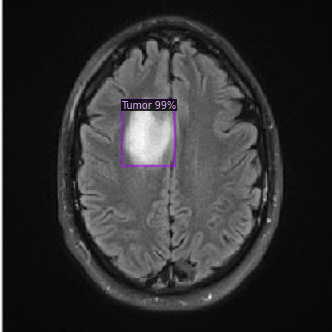



Classes : 
 tensor([0], device='cuda:0')
Scores : 
 tensor([0.9900], device='cuda:0')


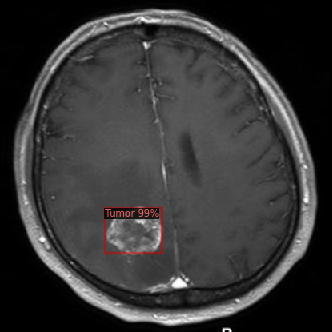



Classes : 
 tensor([0], device='cuda:0')
Scores : 
 tensor([0.9963], device='cuda:0')


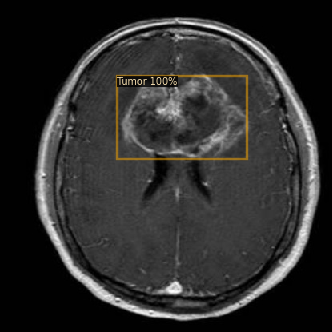



Classes : 
 tensor([0, 0, 0], device='cuda:0')
Scores : 
 tensor([0.9784, 0.8916, 0.5971], device='cuda:0')


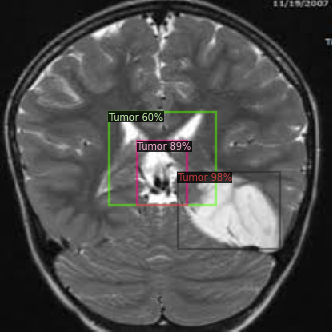

In [ ]:
# Using saved model
my_cfg = get_cfg()
my_cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
my_cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 # Set threshold for this model
my_cfg.MODEL.WEIGHTS = "/content/drive/MyDrive/detectron/brain_tumor_segmentation_mri_2d/model_final.pth"
my_cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
my_model_detectron2 = DefaultPredictor(my_cfg)


from detectron2.utils.visualizer import ColorMode
import glob

for imageName in glob.glob("/content/drive/MyDrive/detectron/brain_tumor_segmentation_mri_2d/test/*jpg"):
  im = cv2.imread(imageName)
  outputs = my_model_detectron2(im)
  print("Classes : \n", outputs["instances"].pred_classes)
  print("Scores : \n", outputs["instances"].scores)

  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata,
                scale=0.8
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])
  print("\n")


In [ ]:
!pip install gradio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 5.3 MB 4.5 MB/s 
     |████████████████████████████████| 270 kB 65.7 MB/s 
     |████████████████████████████████| 54 kB 3.4 MB/s 
     |████████████████████████████████| 2.3 MB 51.0 MB/s 
     |████████████████████████████████| 112 kB 65.1 MB/s 
     |████████████████████████████████| 84 kB 3.8 MB/s 
     |████████████████████████████████| 212 kB 71.5 MB/s 
     |████████████████████████████████| 55 kB 4.1 MB/s 
     |████████████████████████████████| 84 kB 3.6 MB/s 
     |████████████████████████████████| 57 kB 5.1 MB/s 
     |████████████████████████████████| 63 kB 1.8 MB/s 
     |████████████████████████████████| 80 kB 9.8 MB/s 
     |████████████████████████████████| 68 kB 6.6 MB/s 
     |████████████████████████████████| 46 kB 3.9 MB/s 
     |████████████████████████████████| 593 kB 61.5 MB/s 
     |████████████████████████████████| 856 kB 61.

In [1]:
# https://www.gradio.app

# Using saved model
my_cfg = get_cfg()
my_cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
my_cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 # Set threshold for this model
my_cfg.MODEL.WEIGHTS = "/content/drive/MyDrive/detectron/brain_tumor_segmentation_mri_2d/model_final.pth"
my_cfg.MODEL.ROI_HEADS.NUM_CLASSES = 1
my_model_detectron2 = DefaultPredictor(my_cfg)

from detectron2.utils.visualizer import ColorMode

import numpy as np
import gradio as gr
import requests
#from PIL import Image
import cv2

def inference(img):
    H,W = 416, 416
    img = cv2.resize(img, (H, W))
    outputs = my_model_detectron2(img)
    v = Visualizer(img[:, :, ::-1],
                metadata=test_metadata,
                scale=0.8
                 )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    return out.get_image()[:, :, ::-1]

gr.Interface(fn=inference,
             inputs=gr.inputs.Image(),
             outputs=gr.outputs.Image(),
             theme="dark").launch(share=True) #debug=True Use in Colab


NameError: name 'get_cfg' is not defined